<H1>Exploratory Spatial Data Analysis (ESDA) on Crime Data</H1>

<H3>Exploratory Spatial Data Analysis Example Code Snippet</H3>

In [1]:
# Install these libraries if you don't have them already
"""
!pip install pandas
!pip install geopandas
!pip install shapely
!pip install scikit-learn
!pip install folium
!pip install matplotlib
!pip install seaborn
"""

'\n!pip install pandas\n!pip install geopandas\n!pip install shapely\n!pip install scikit-learn\n!pip install folium\n!pip install matplotlib\n!pip install seaborn\n'

In [2]:
# Required Python Packages
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from sklearn.cluster import DBSCAN
import folium
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Read the data file (crime_Incidents_2016.csv)

file_path = 'crime_incidents_2016.csv'

# Read the CSV file into a pandas DataFrame
crime_data = pd.read_csv(file_path)
crime_data.columns = crime_data.columns.str.lower()
print(crime_data.head())
print(crime_data.info())
print(crime_data.describe())

   longitude   latitude  objectid       ccn            reportdatetime  \
0 -76.946978  38.893354    182201  16015685  2016-01-31T23:17:56.000Z   
1 -77.038520  38.904251    182202  16015745  2016-02-01T00:00:00.000Z   
2 -77.026528  38.898317    182203  16015704  2016-02-01T01:15:34.000Z   
3 -77.027916  38.939215    182204  16015736  2016-02-01T01:35:52.000Z   
4 -76.970423  38.867778    182205  16015695  2016-02-01T02:17:26.000Z   

      shift                     offense  method          lastmodifieddate  \
0  MIDNIGHT                     ROBBERY     GUN  2016-06-24T08:32:06.000Z   
1  MIDNIGHT                    HOMICIDE   KNIFE  2016-06-24T08:32:18.000Z   
2  MIDNIGHT  ASSAULT W/DANGEROUS WEAPON  OTHERS  2016-06-24T08:32:06.000Z   
3  MIDNIGHT                THEFT F/AUTO  OTHERS  2016-06-24T08:32:06.000Z   
4  MIDNIGHT                THEFT F/AUTO  OTHERS  2016-06-24T08:32:06.000Z   

                         blocksiteaddress  ...  anc  district  \
0       300 - 499 BLOCK OF 40TH S

<H2>Spacial Cluster Analysis to Identifying Crime Hotspots</H2> 

Use spatial clustering to identify areas with a significantly higher concentration of crime incidents. 

DBSCAN can identify clusters of random shapes and is not sensitive to the density of the clusters. This is important in crime analysis as crime patterns may not always conform to regular shapes, and the density of incidents can vary across different areas. DBSCAN does not require the number of clusters to be specified in advance. 

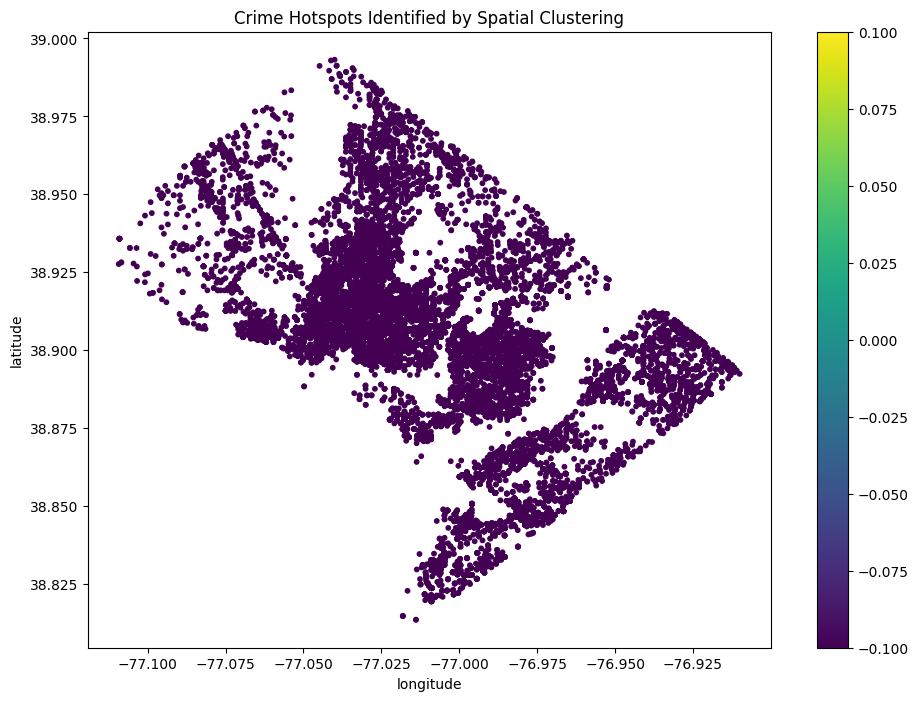

In [4]:
# Create a list of geometry objects
geometry = [Point(xy) for xy in zip(crime_data['longitude'], crime_data['latitude'])] 
crime_geo_df = gpd.GeoDataFrame(crime_data, geometry=geometry)

# Use DBSCAN for spatial clustering of the crime data
eps = 0.2  # The maximum distance between two samples for one to be considered as in the neighborhood of the other
min_samples = 10  # The number of samples
dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='euclidean')
clusters = dbscan.fit_predict(crime_geo_df[['latitude', 'longitude']])

# Add the cluster labels to the GeoDataFrame
crime_geo_df['Cluster'] = clusters

# Visualize the clusters on a scatter plot
fig, ax = plt.subplots(figsize=(12, 8))
crime_geo_df.plot(ax=ax, column='Cluster', legend=True, markersize=10, cmap='viridis')
plt.title('Crime Hotspots Identified by Spatial Clustering')
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.show()

# Visualize the clusters on Map

# Create a folium map centered around the average coordinates of the crime data
map_center = [crime_geo_df['latitude'].mean(), crime_geo_df['longitude'].mean()]
crime_map = folium.Map(location=map_center, zoom_start=12)

# Add crime incidents to the map with cluster markers and popups
marker_cluster = MarkerCluster().add_to(crime_map)

# Add the cluster markers to the map
for idx, row in crime_geo_df.iterrows():
    folium.Marker([row['latitude'], row['longitude']], popup=f"Cluster: {row['Cluster']}").add_to(marker_cluster)

crime_map.save('maps/crime_hotspots_map.html')
crime_map


<H2>Crime Incidents by Day of the Week</H2>

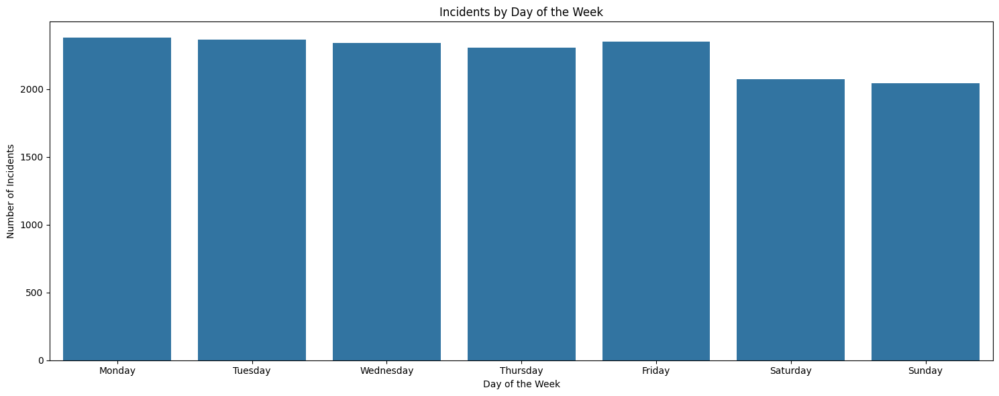

In [5]:
# Convert relevant date columns to datetime format
date_columns = ['reportdatetime', 'lastmodifieddate', 'start_date', 'end_date']
for col in date_columns:
    crime_data[col] = pd.to_datetime(crime_data[col])

# Extract day of the week and month from the 'reportdatetime' column
crime_data['day_of_week'] = crime_data['reportdatetime'].dt.day_name()
crime_data['month'] = crime_data['reportdatetime'].dt.month_name()

# Group by day of the week and month, and count the number of incidents
day_of_week_counts = crime_data.groupby('day_of_week').size().reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
)

# Visualize the number of incidents by day of the week
plt.figure(figsize=(15, 6))
sns.barplot(x=day_of_week_counts.index, y=day_of_week_counts.values, order=day_of_week_counts.index)
plt.title('Incidents by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Incidents')
plt.tight_layout()
plt.show()
